# Анализ рынка заведений общественного питания Москвы

Исследование рынка Москвы, поиск интересных особенностей, которые в будущем помогут в выборе подходящего инвесторам места.

**Цель исследования** — определение наиболее перспективного округа для открытия кофейни и стоимость чашки кофе для успешного старта проекта.

**Ход исследования**

Анализ построен на датасете с заведениями общественного питания Москвы, на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. О качестве данных ничего не известно. Поэтому перед проверкой гипотез понадобится обзор данных. 

Проверим данные на ошибки и оценим их влияние на исследование. Затем, на этапе предобработки поищем возможность исправить самые критичные ошибки данных.
 
Таким образом, исследование пройдёт в четыре этапа:
 1. Обзор данных.
 2. Предобработка данных.
 3. Анализ данных.
 4. Детализированное исследования для открытия кофейни
 
В процессе анализа дадим ответы на вопросы:
 * Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
 * Есть ли круглосуточные кофейни?
 * Какие у кофеен рейтинги? Как они распределяются по районам?
 * На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?



In [1]:
import pandas as pd
#import numpy as np
from IPython.display import display
#import matplotlib as mpl
import matplotlib.pyplot as plt 
import seaborn as sns
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
import json
import os
#import datetime as dt
#import scipy.stats as st
#import math as mth

In [2]:
pd.options.display.max_colwidth = 150

In [3]:
moscow_lat, moscow_lng = 55.751244, 37.618423
drm = all_m = mab = cof_m = m_rat_cof = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster1 = MarkerCluster().add_to(all_m)
marker_cluster2 = MarkerCluster().add_to(cof_m)

In [4]:
state_geo_l1 = '/datasets/admin_level_geomap.geojson'
state_geo_w1 = 'datasets\admin_level_geomap.geojson'

In [5]:
pthl1 = '/datasets/moscow_places.csv'
pthw1 = 'datasets\moscow_places.csv'

Зададим необходимые функции

In [6]:
# Проверка на пропуски и дубликаты в данных
def data_gaps(file, name):
    file[name] = file[name].apply(replace_duplicates)
    file_len = len(file)
    file_nunique = file[name].nunique()
    file_dup = file.duplicated().sum() # Количество дубликатов
    file_dup_pers = round(file.duplicated().sum()/len(file)*100, 2).astype('str') # Процент дубликатов в датасете
    msg = 'Процент дубликатов в датасете - ' + file_dup_pers + '%'
    print('Количество строк в данных -', file_len)
    print('Количество уникальных наименований в данных -', file_nunique)
    print('Количество дубликатов -', file_dup)    
    print(msg)
    resume = 'Пропусков не обнаружено'
    for i in file:
        if len(file[file[i].isna()]) != 0:
            resume = 'Пропуски обнаружены'
            print('Количество пропусков в', i, '-', len(file[file[i].isna()])) # выводим только пропуски
    print(resume)

In [7]:
# Функция замены всеx неправильныеx значений на правильные для выбранного столбца
def replace_wrong_values(dataset, column, wrong_values, correct_value): # на вход функции подаются список неправильных значений и строка с правильным значением
    for wrong_value in wrong_values: # перебираем неправильные имена
        dataset[column] = dataset[column].replace(wrong_value, correct_value) # и для каждого неправильного имени вызываем метод replace()

In [8]:
# Функция замены всеx неправильныеx значений на правильные для выбранной ячейки
def replace_duplicates(row):
    try:
        row = row.lower()
        if '№1' in row:
            row = row.replace('№1', '№ 1')
        if '.' in row:
            row = row.replace('.', ' ')
        if '  ' in row:
            row = row.replace('  ', ' ')
        else:
            return row
        return row
    except:
        return row

In [9]:
# Создание кластеров на карте
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

## Обзор данных

In [10]:
if os.path.exists(pthl1):
    data = pd.read_csv(pthl1)
elif os.path.exists(pthw1):
    data = pd.read_csv(pthw1)
else:
    print('Something is wrong')

In [11]:
if os.path.exists(state_geo_l1):
    state_geo = state_geo_l1
elif os.path.exists(state_geo_w1):
    state_geo = state_geo_w1
else:
    print('Something is wrong')

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [13]:
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


## Подготовка данных

In [14]:
data_gaps(data, 'name')

Количество строк в данных - 8406
Количество уникальных наименований в данных - 5509
Количество дубликатов - 0
Процент дубликатов в датасете - 0.0%
Количество пропусков в hours - 536
Количество пропусков в price - 5091
Количество пропусков в avg_bill - 4590
Количество пропусков в middle_avg_bill - 5257
Количество пропусков в middle_coffee_cup - 7871
Количество пропусков в seats - 3611
Пропуски обнаружены


Удаление пропусков приведёт к непоправимым потерям, оставим, как есть.

Добавим столбец с названиями улиц из столбца с адресом

In [15]:
for i in data['address']:
    tokens = []
    tokens = [s.strip() for s in i.split(',')]
    data.loc[(data['address'] == i), 'street'] = tokens[1]

Добавим признак круглосуточнй работы

In [16]:
data['is_24/7'] = False

In [17]:
for i in data['hours'].unique():
    data.loc[(data['hours'] == 'ежедневно, круглосуточно'), 'is_24/7']  = True

In [18]:
data[['name', 'address']].duplicated().sum()

3

Произведена проверка на явные дубликаты, устранены неявные дубликаты, произведена проверка на пропуски, добавлены столбцы с адресои и признаком круглосуточности.

## Анализ данных

### Категории заведений, представленые в данных

In [18]:
category = data['category'].unique()

In [19]:
print(category)

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [20]:
category_count = data.groupby('category').agg({'name':'count'}).sort_values(by='name', ascending=False).reset_index()

In [21]:
category_count

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


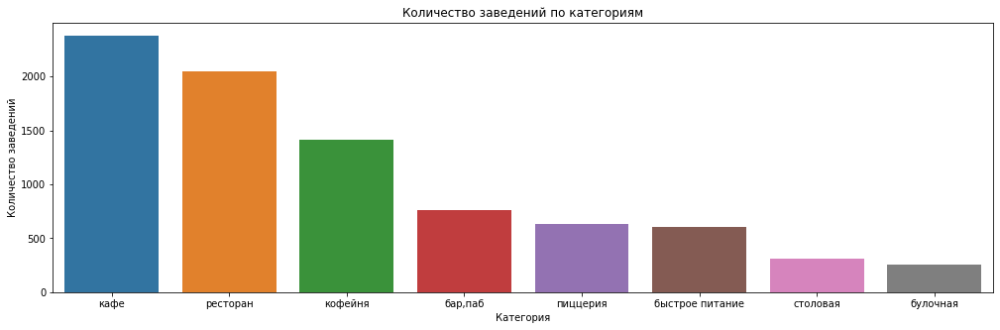

In [22]:
plt.figure(figsize=(17, 5))
ax = sns.barplot(x='category', y='name', data=category_count)
plt.title('Количество заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.show()

В датасете представлены 8 категорий заведений: кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная, столовая.

### Kоличество посадочных мест в заведениях по категориям

In [23]:
category_seats_count = data.groupby('category').agg({'seats':'sum'}).sort_values(by='seats', ascending=False).reset_index()

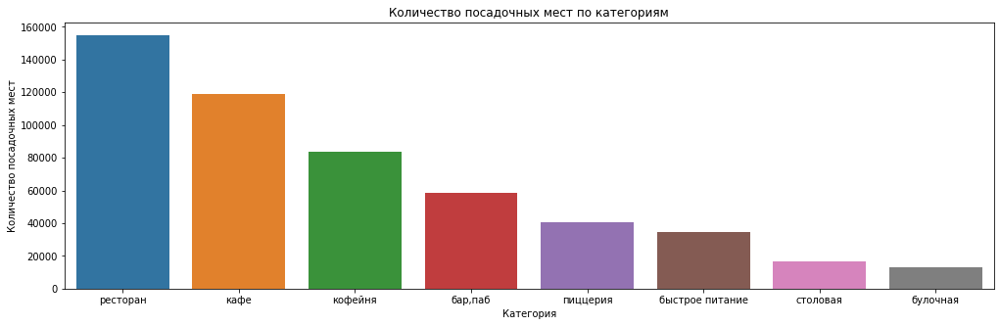

In [24]:
plt.figure(figsize=(17, 5))
ax = sns.barplot(x='category', y='seats', data=category_seats_count)
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.show()

In [25]:
category_seats_median = data.groupby('category').agg({'seats':'median'}).sort_values(by='seats', ascending=False).reset_index()

In [26]:
category_seats_median

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


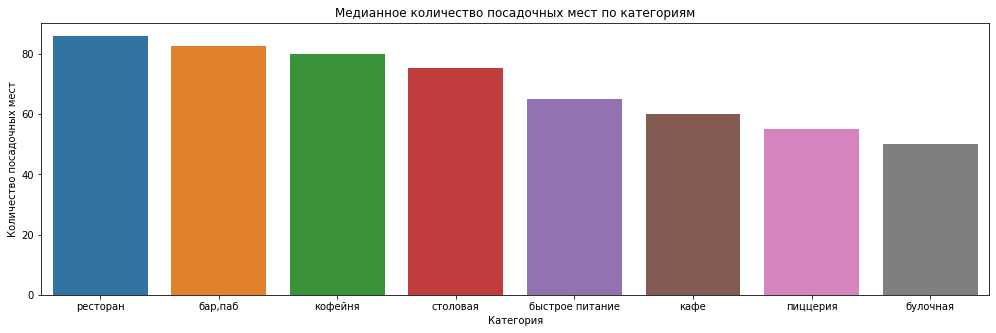

In [27]:
plt.figure(figsize=(17, 5))
ax = sns.barplot(x='category', y='seats', data=category_seats_median)
plt.title('Медианное количество посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.show()

Наибольшее кольчество мест в категории "ресторан", а медианное "бар/паб" не сильно от них отстаёт.

### Cоотношение сетевых и несетевых заведений

In [28]:
chain_count = data.groupby('chain').agg({'name':'count'}).reset_index()

In [29]:
for i in chain_count['chain'].unique():
    chain_count.loc[(chain_count['chain'] == 0), 'chain']  = 'Несетевые'
    chain_count.loc[(chain_count['chain'] == 1), 'chain']  = 'Сетевые'

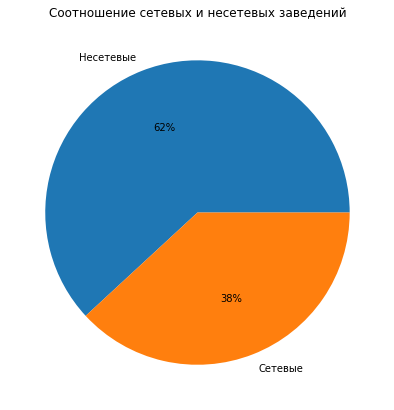

In [30]:
plt.figure(figsize=(17, 7))
plt.pie(chain_count['name'], labels=chain_count['chain'], autopct='%.0f%%')
plt.title('Cоотношение сетевых и несетевых заведений')
#plt.xlabel('Категория')
#plt.ylabel('Количество заведений')
plt.show();

In [31]:
category_chain_count = data.groupby(['category', 'chain']).agg({'street':'count'}).sort_values(by='street', ascending=False).reset_index()

In [32]:
category_chain_count

,category,chain,street
0,кафе,0,1599
1,ресторан,0,1313
2,кафе,1,779
3,ресторан,1,730
4,кофейня,1,720
5,кофейня,0,693
6,"бар,паб",0,596
7,быстрое питание,0,371
8,пиццерия,1,330
9,пиццерия,0,303


In [33]:
for i in category_chain_count['chain'].unique():
    category_chain_count.loc[(category_chain_count['chain'] == 0), 'chain']  = 'Несетевые'
    category_chain_count.loc[(category_chain_count['chain'] == 1), 'chain']  = 'Сетевые'

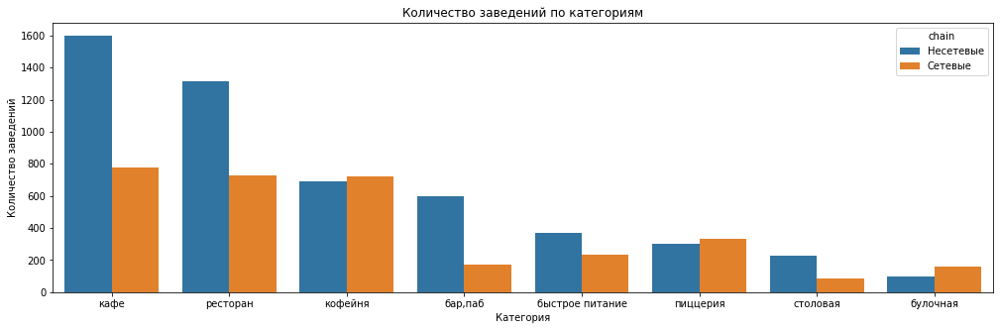

In [34]:
plt.figure(figsize=(17, 5))
ax = sns.barplot(x='category', y='street', hue='chain', data=category_chain_count)
plt.title('Количество заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.show()

Cоотношение сетевых и несетевых заведений в категориях:
кафе


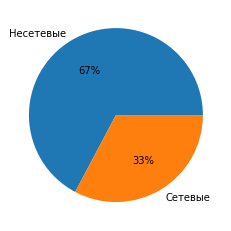

ресторан


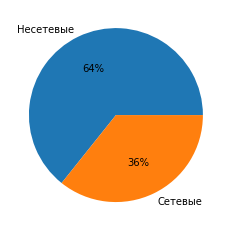

кофейня


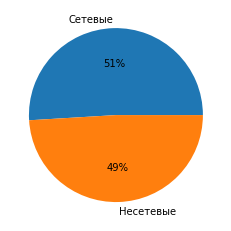

бар,паб


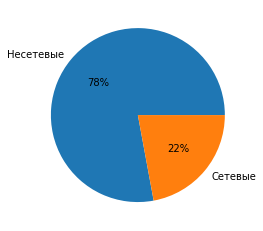

быстрое питание


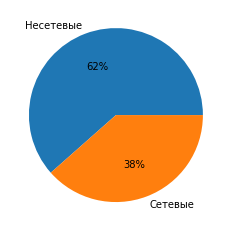

пиццерия


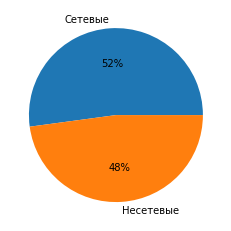

столовая


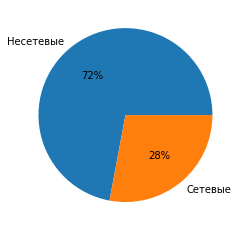

булочная


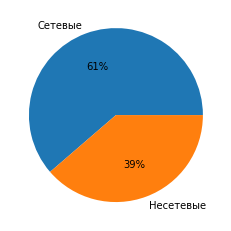

In [35]:
#fig = plt.figure(figsize=(17, 17))
#fig, (ax1, ax2) = 
print('Cоотношение сетевых и несетевых заведений в категориях:')
for i in category_chain_count['category'].unique():
    print(i)
    #plt.title('Cоотношение сетевых и несетевых заведений в категории', @i)
    plt.pie(category_chain_count.query('category == @i')['street'], labels=category_chain_count.query('category == @i')['chain'], autopct='%.0f%%')
    #ax = fig.add_subplot(121)
    plt.show();
#plt.xlabel('Категория')
#plt.ylabel('Количество заведений')


Количество несетевых заведений примерно на треть больше, чем сетевых, лишь кофейни и пиццерии распределяются примерно поровну.

### Tоп-15 популярных сетей в Москве

In [36]:
chain = data.query('chain == 1')

In [37]:
chain_top = chain.groupby(['name', 'category']).agg({'address':'count'}).sort_values(by='address', ascending=False).reset_index().head(15)

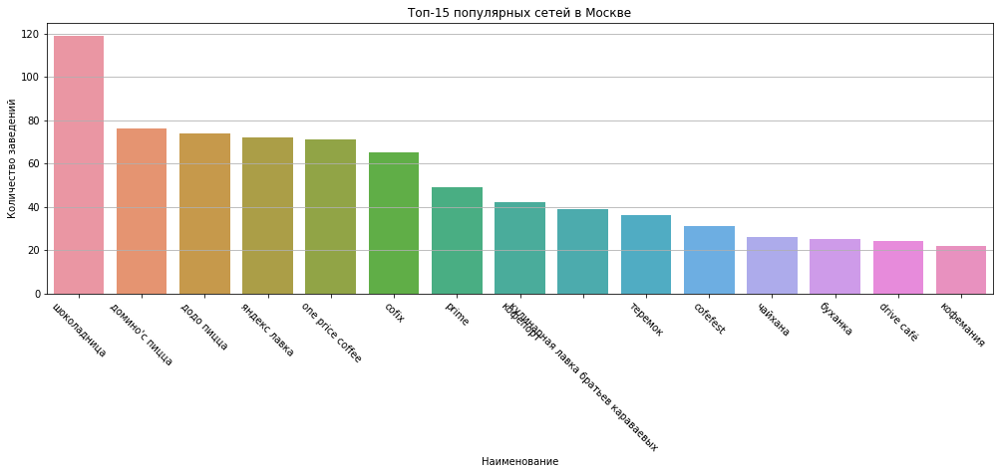

In [38]:
plt.figure(figsize=(17, 5))
plt.grid(True)
# ax = sns.barplot(x='name', y='address', hue='category', data=chain_top)
ax = sns.barplot(x='name', y='address', data=chain_top)
# ax = sns.barplot(x='category', y='address', data=chain_top)
plt.title('Tоп-15 популярных сетей в Москве')
plt.xlabel('Наименование')
plt.ylabel('Количество заведений')
plt.xticks(rotation = -45) 
plt.show()

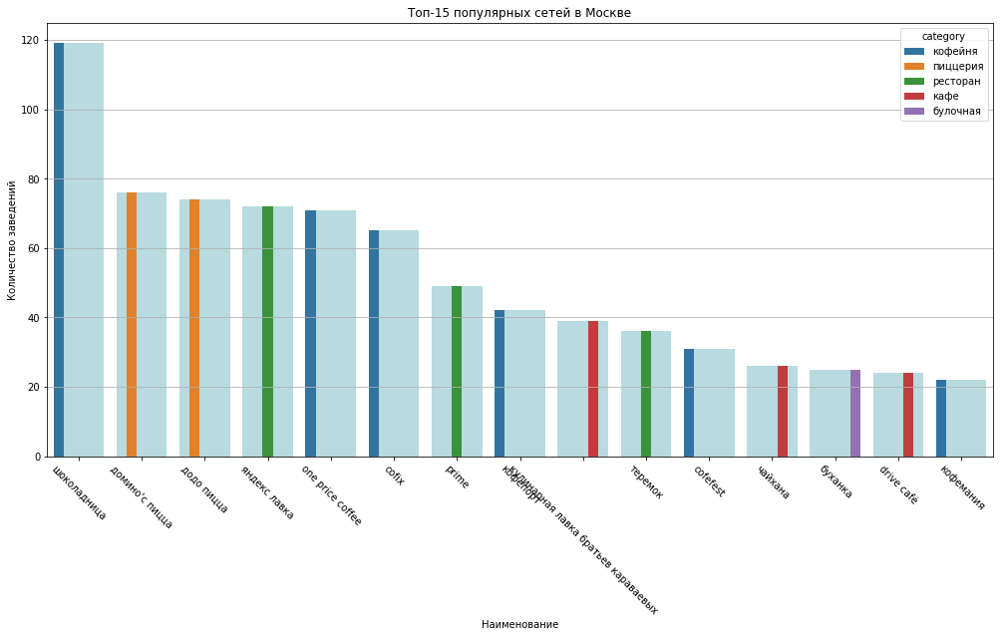

In [39]:
plt.figure(figsize=(17, 8))
plt.grid(True)
ax = sns.barplot(x='name', y='address', data=chain_top, color='#b0e0e6')
ax = sns.barplot(x='name', y='address', hue='category', data=chain_top)
#ax = sns.barplot(x='category', y='address', data=chain_top)
plt.title('Tоп-15 популярных сетей в Москве')
plt.xlabel('Наименование')
plt.ylabel('Количество заведений')
plt.xticks(rotation = -45)
plt.show()

Лидером по количеству заведений среди сетевых брендов является "Шоколадница" (120 точек), следующая сеть (Домино`с пицца) отстаёт более чем на 30%, остальные ещё сильнее. Яндекс Лавка только набирает обороты и будет расти.

### Kоличество заведений по районам

In [40]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [41]:
district_category = data.groupby(['district', 'category']).agg({'address':'count'}).sort_values(by='address', ascending=False).reset_index()

In [42]:
district_count = data.groupby(['district']).agg({'address':'count'}).sort_values(by='address', ascending=False).reset_index()

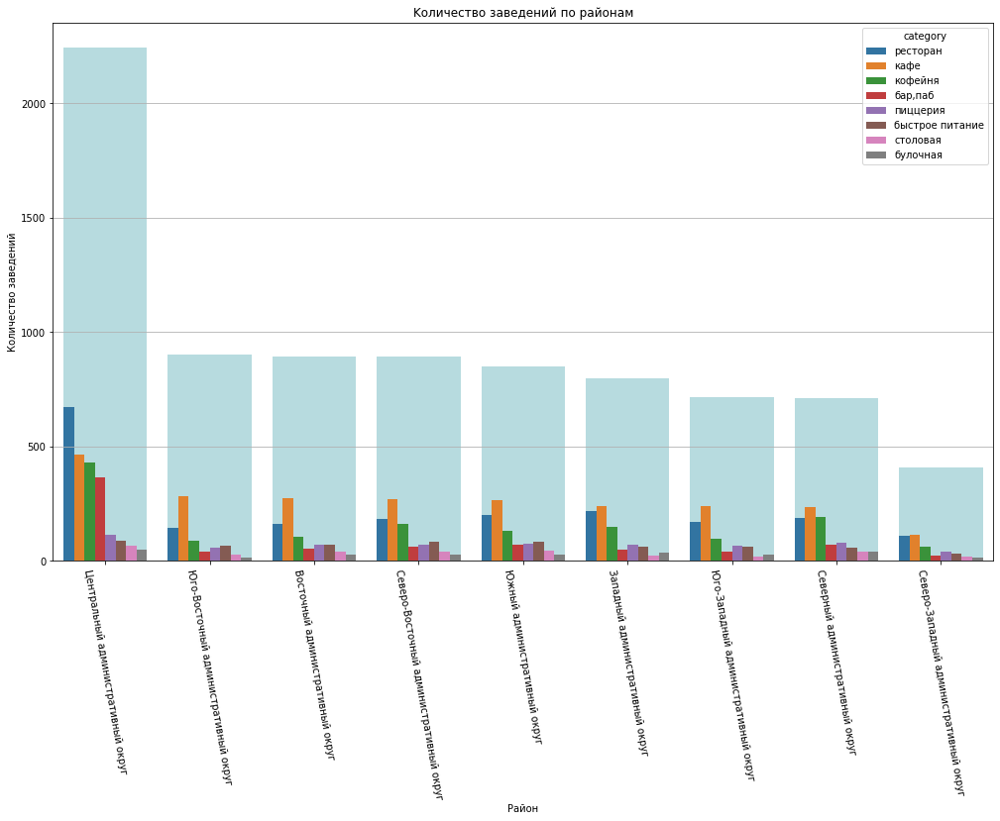

In [43]:
plt.figure(figsize=(17, 10))
plt.grid(True)
ax = sns.barplot(x='district', y='address', data=district_count, color='#b0e0e6')
ax = sns.barplot(x='district', y='address', hue='category', data=district_category)
#ax = sns.barplot(x='category', y='address', data=chain_top)
plt.title('Kоличество заведений по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = -80)
plt.show()

Больше всего заведений расположено в Центральном административном округе.

### Pаспределение средних рейтингов по категориям заведений

In [44]:
rating_mean = data.groupby('category').agg({'rating':'mean'}).sort_values(by='rating', ascending=False).reset_index()

In [45]:
rating_mean_name = rating_mean['category'].unique()

In [46]:
rating_mean_name

array(['бар,паб', 'пиццерия', 'ресторан', 'кофейня', 'булочная',
       'столовая', 'кафе', 'быстрое питание'], dtype=object)

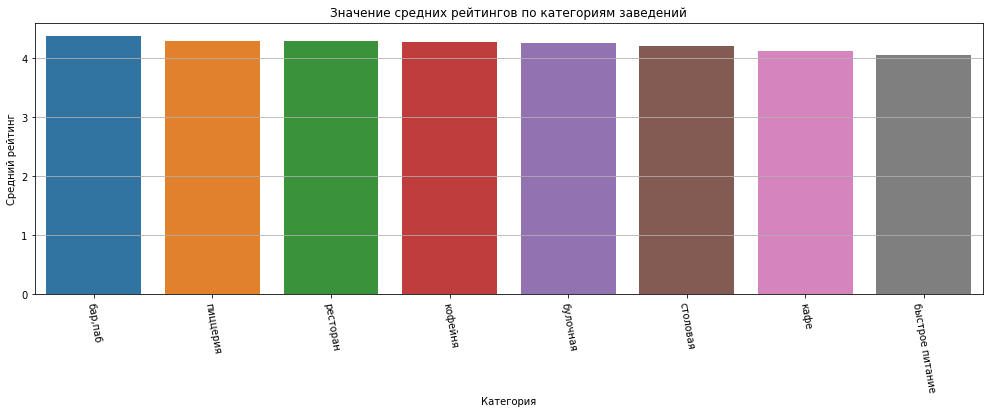

In [47]:
plt.figure(figsize=(17, 5))
plt.grid(True)
ax = sns.barplot(x='category', y='rating', data=rating_mean)
plt.title('Значение средних рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation = -80)
plt.show()

Рейтинги различаются незначительно

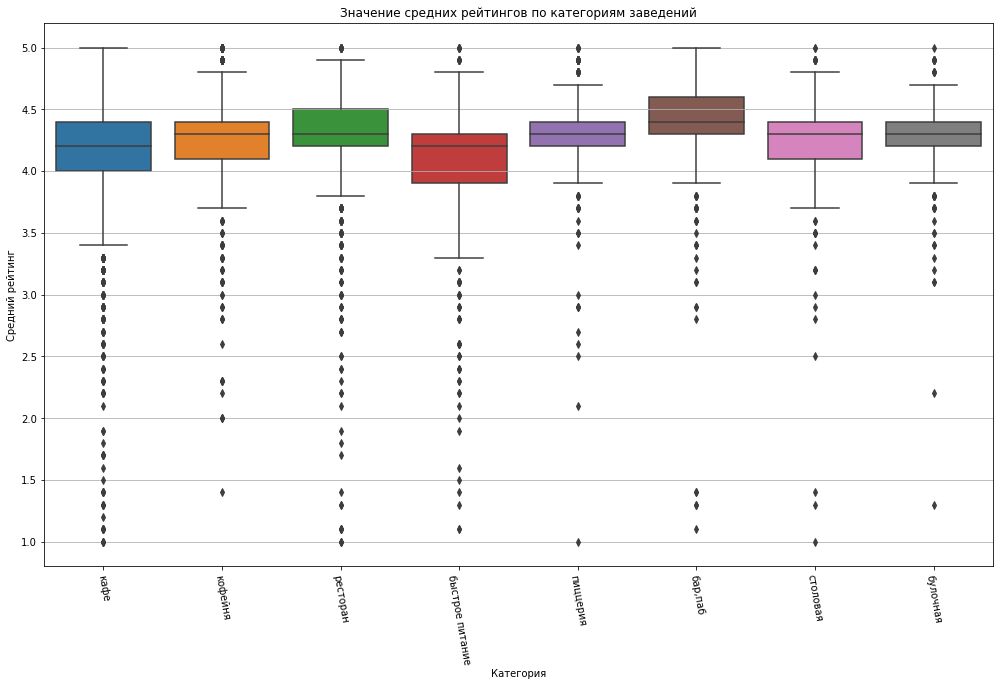

In [48]:
plt.figure(figsize=(17, 10))
plt.grid(True)
ax = sns.boxplot(x='category', y='rating', data=data[['category', 'rating']].sort_values(by='rating', ascending=False))
plt.title('Значение средних рейтингов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation = -80)
plt.show()

### Картограмма со средним рейтингом заведений каждого района

In [49]:
district_rating_mean = data.groupby('district').agg({'rating':'mean'}).reset_index()

In [45]:
Choropleth(
    geo_data=state_geo,
    data=district_rating_mean,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(drm)

drm

### Bсе заведения датасета на карте

In [46]:
# Создание кластеров на карте
def create_clusters_1(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster1)
# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters_1, axis=1)

all_m

### Tоп-15 улиц по количеству заведений

In [50]:
street_top = data.groupby(['street']).agg({'address':'count'}).sort_values(by='address', ascending=False).reset_index().head(15)

In [51]:
street_top_name = street_top['street'].unique()

In [52]:
street_category_top = data.query('street in @street_top_name').groupby(['street', 'category']).agg({'address':'count'}).reset_index()

In [53]:
street_category_top

,street,category,address
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [54]:
street_top = street_category_top.groupby('street').agg({'address':'sum'}).sort_values(by='address', ascending=False).reset_index()

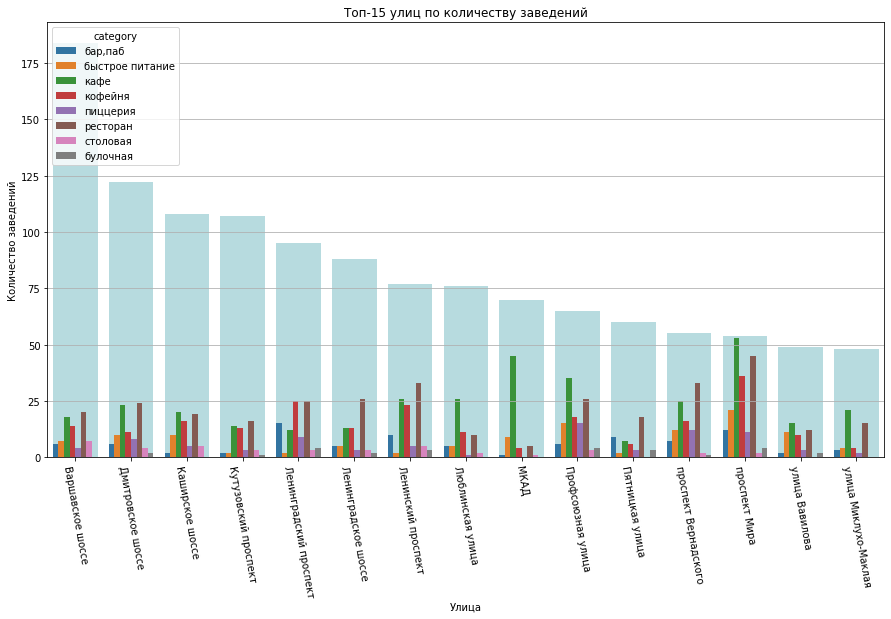

In [55]:
plt.figure(figsize=(15, 8))
plt.grid(True)
ax = sns.barplot(x='street', y='address', data=street_top, color='#b0e0e6')
ax = sns.barplot(x='street', y='address', hue='category', data=street_category_top)
#ax = sns.barplot(x='category', y='address', data=chain_top)
plt.title('Tоп-15 улиц по количеству заведений')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')
plt.xticks(rotation = -80)
plt.show()

Самая популярная улица у рестораторов - проспект Мира, остальные сильно отстают - 30% и более.

### Улицы с одним объектом

In [56]:
street_bottom = data.groupby(['street']).agg({'address':'count'}).sort_values(by='address').query('address == 1').reset_index()

In [57]:
street_bottom_name = street_bottom['street'].unique()

In [58]:
data_street_bottom = data.query('street in @street_bottom_name').reset_index(drop=True)

In [59]:
print(len(data_street_bottom))
len(data_street_bottom.query('hours == "ежедневно, круглосуточно"'))

458


31

In [60]:
data_street_bottom

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
1,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
2,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
3,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
4,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
454,wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
455,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
456,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


Внутриквартальное расположение заведений на очень маленьких или сильно извилистых улочках, в основном, некруглосуточный режим работы, приличная удалённность от центра.

### Медиана средних чеков по округам

Оставим только строки с информацией о среднем чеке

In [61]:
data_middle_avg_bill = data.dropna(subset=['middle_avg_bill'])

In [62]:
middle_avg_bill = data_middle_avg_bill.groupby('district').agg({'middle_avg_bill':'median'}).reset_index()

In [63]:
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана средних чеков по округам',
).add_to(mab)

mab

In [63]:
middle_avg_bill.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Самый высокий средний чек в центре, "элитных" и приближенных к ним районах, в остальном, чем дальше от центра или менее престижно, тем ценник ниже.

### Oсобенности заведений с плохими рейтингами

In [64]:
data.query('rating < 4').dropna(subset=['price']).sort_values(by='rating')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1125,на мангале,кафе,"Москва, проспект Мира, 119, стр. 503",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.830405,37.617687,1.0,высокие,Средний счёт:4000–5000 ₽,4500.0,NaN,0,NaN,проспект Мира,False
7387,крошка картошка,быстрое питание,"Москва, Поречная улица, 10",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.649376,37.771200,1.6,средние,Средний счёт:200 ₽,200.0,NaN,1,0.0,Поречная улица,False
6835,бак бо,кафе,"Москва, Ленинский проспект, 109",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.663873,37.511844,1.6,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,98.0,Ленинский проспект,False
2103,кафе солей,кафе,"Москва, Новодмитровская улица, 5А, стр. 1",Северо-Восточный административный округ,"пн-пт 09:00–22:00; сб,вс 12:00–22:00",55.806564,37.588598,1.7,средние,Средний счёт:700 ₽,700.0,NaN,0,80.0,Новодмитровская улица,False
4274,миндаль,кафе,"Москва, площадь Киевского Вокзала, 2",Западный административный округ,"ежедневно, 09:00–23:00",55.743916,37.565489,1.8,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,300.0,площадь Киевского Вокзала,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6255,avkvadrate,кафе,"Москва, Лужнецкая набережная, 2/4с51",Центральный административный округ,"пн-пт 09:00–21:00; сб,вс 10:00–19:00",55.714987,37.571901,3.9,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,NaN,Лужнецкая набережная,False
4323,кафе m-city,ресторан,"Москва, Пресненская набережная, 2",Центральный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.749397,37.540221,3.9,выше среднего,Средний счёт:650–2000 ₽,1325.0,NaN,0,350.0,Пресненская набережная,False
4287,lav cafe,кофейня,"Москва, улица Можайский Вал, 8Д",Западный административный округ,пн-пт 08:00–20:00,55.743431,37.555768,3.9,средние,Средний счёт:500–700 ₽,600.0,NaN,0,NaN,улица Можайский Вал,False
4145,caffetteria,кафе,"Москва, Киевская улица, 2, стр. 5",Западный административный округ,"ежедневно, 09:00–21:00",55.743481,37.563312,3.9,средние,Средний счёт:300–1000 ₽,650.0,NaN,0,NaN,Киевская улица,False


In [65]:
len(data_street_bottom.query('hours == "ежедневно, круглосуточно" and rating < 4'))

9

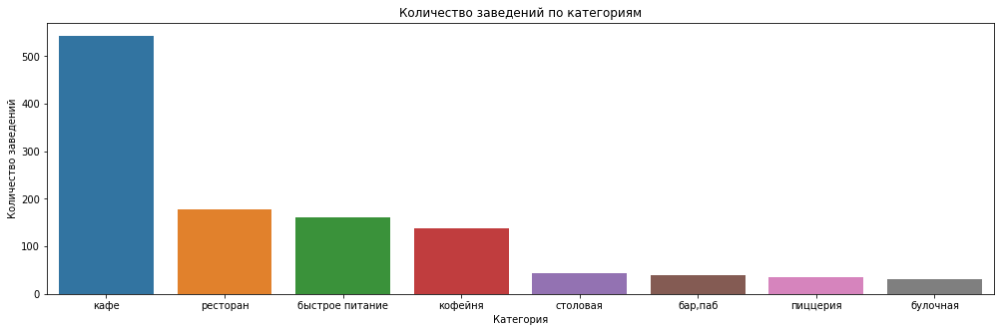

In [66]:
plt.figure(figsize=(17, 5))
ax = sns.barplot(x='category', y='name', data=data.query('rating < 4').groupby('category').agg({'name':'count'}).sort_values(by='name', ascending=False).reset_index())
plt.title('Количество заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.show()

В датасете 1169 заведений с рейтингом ниже 4-х, что составляет 13.% от общего числа. Цены средние или высокие, что, видимо, не оправдывает ожиданий посетителей. Превалируют кафе, их, в принципе, большинство в датасете.

### Вывод

* В датасете представлены 8 категорий заведений: кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная, столовая.
* Наибольшее кольчество мест в категории "ресторан", а медианное "бар/паб" не сильно от них отстаёт.
* Количество несетевых заведений примерно на треть больше, чем сетевых.
* Лидером по количеству заведений среди сетевых брендов является "Шоколадница" (120 точек), следующая сеть (Домино`с пицца) отстаёт более чем на 30%, остальные ещё сильнее. Яндекс Лавка только набирает обороты и будет расти.
* Больше всего заведений расположено в Центральном административном округе.
* Наибольший средний рейтинг, также в ЦАО.
* Самая популярная улица у рестораторов - проспект Мира, остальные сильно отстают - 30% и более.
* Самый высокий средний чек в центре, "элитных" и приближенных к ним районах, в остальном, чем дальше от центра или менее престижно, тем ценник ниже.

## Исследование для открытия кофейни

In [67]:
data_coffee = data.query('category == "кофейня"')

In [68]:
print('Общее количество кофеен в датасете -', len(data_coffee))

Общее количество кофеен в датасете - 1413


In [69]:
district_coffee_count = data_coffee.groupby(['district']).agg({'address':'count'}).sort_values(by='address', ascending=False).reset_index()

### Kоличество кофеен по районам

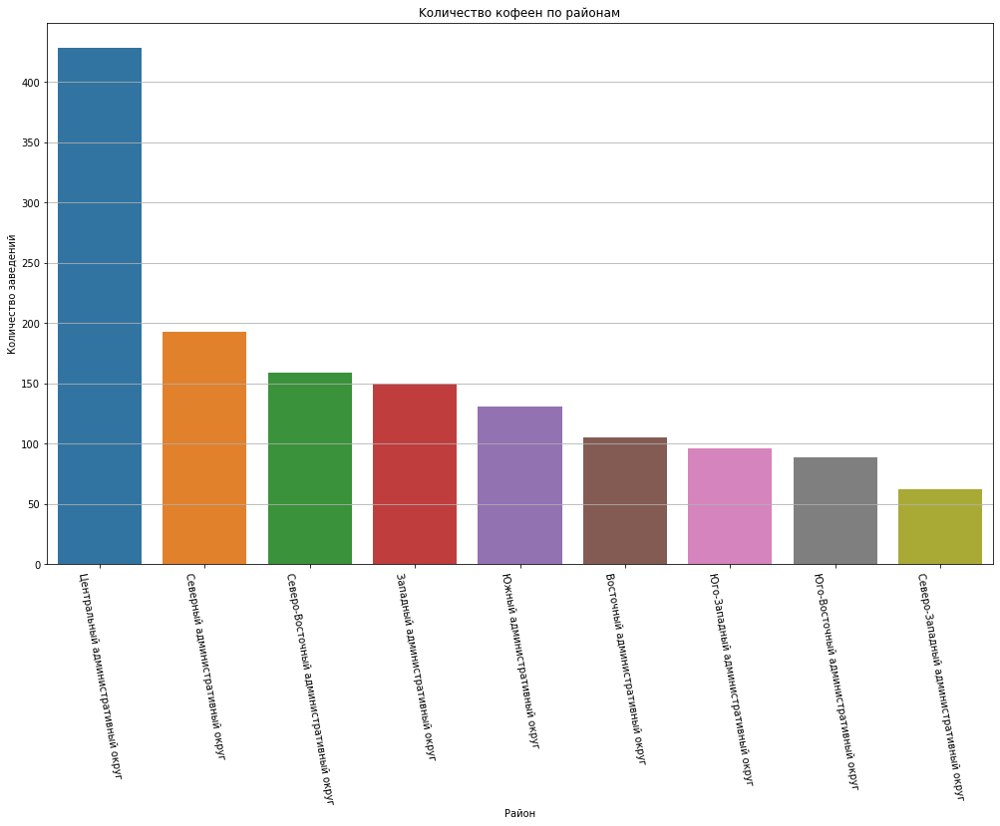

In [70]:
plt.figure(figsize=(17, 10))
plt.grid(True)
ax = sns.barplot(x='district', y='address', data=district_coffee_count)
plt.title('Kоличество кофеен по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation = -80)
plt.show()

In [71]:
def create_clusters_2(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster2)
data_coffee.apply(create_clusters_2, axis=1)
cof_m

In [72]:
print('Количество круглосуточных кофеен -', len(data_coffee.query('hours == "ежедневно, круглосуточно"')))

Количество круглосуточных кофеен - 59


In [73]:
data_coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
8365,квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,Волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
8385,cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False


### Средний рейтинг кофеен по районам

In [74]:
data_coffee_rating_mean = data_coffee.groupby('district').agg({'rating':'mean'}).reset_index()

In [75]:
Choropleth(
    geo_data=state_geo,
    data=data_coffee_rating_mean,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m_rat_cof)

m_rat_cof

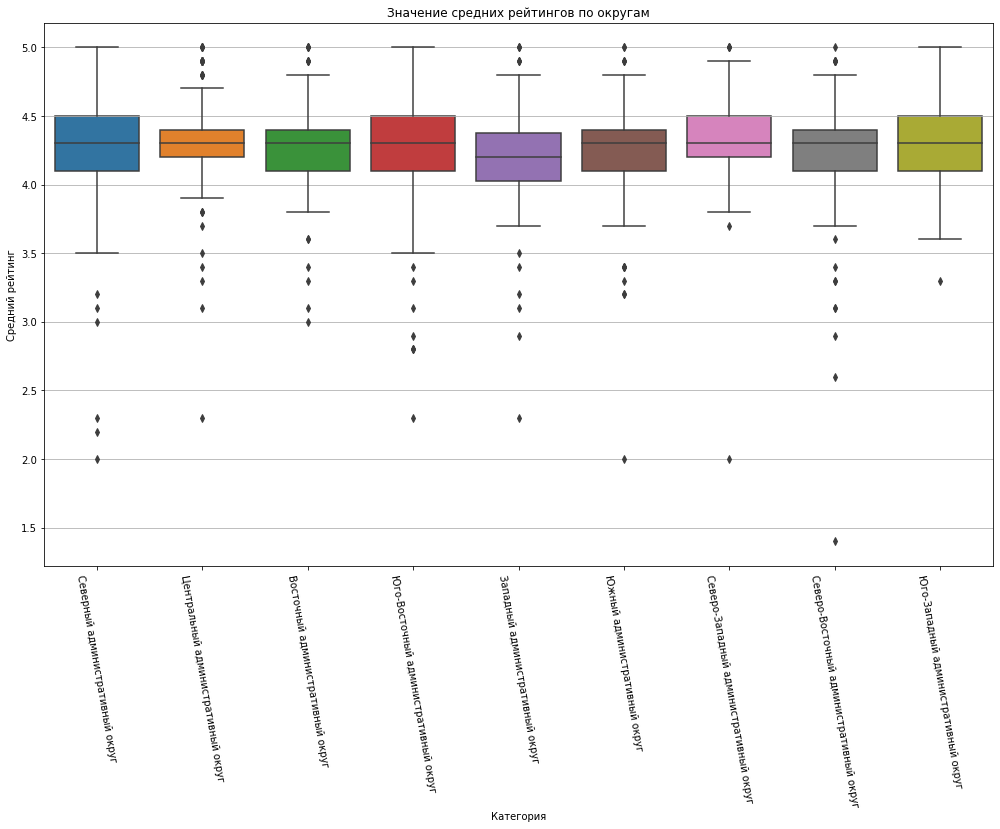

In [76]:
plt.figure(figsize=(17, 10))
plt.grid(True)
ax = sns.boxplot(x='district', y='rating', data=data_coffee[['district', 'rating']].sort_values(by='rating', ascending=False))
plt.title('Значение средних рейтингов по округам')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation = -80)
plt.savefig('data_coffee_rating_mean')

### Медианная стоимость чашки кофе по районам

In [77]:
data_coffee.groupby('district').agg({'middle_coffee_cup':'median', 'name':'count', 'rating':'mean'}).reset_index()

,district,middle_coffee_cup,name,rating
0,Восточный административный округ,135.0,105,4.282857
1,Западный административный округ,189.0,150,4.195333
2,Северный административный округ,159.0,193,4.291710
3,Северо-Восточный административный округ,162.5,159,4.216981
4,Северо-Западный административный округ,165.0,62,4.325806
5,Центральный административный округ,190.0,428,4.336449
6,Юго-Восточный административный округ,147.5,89,4.225843
7,Юго-Западный административный округ,198.0,96,4.283333
8,Южный административный округ,150.0,131,4.232824


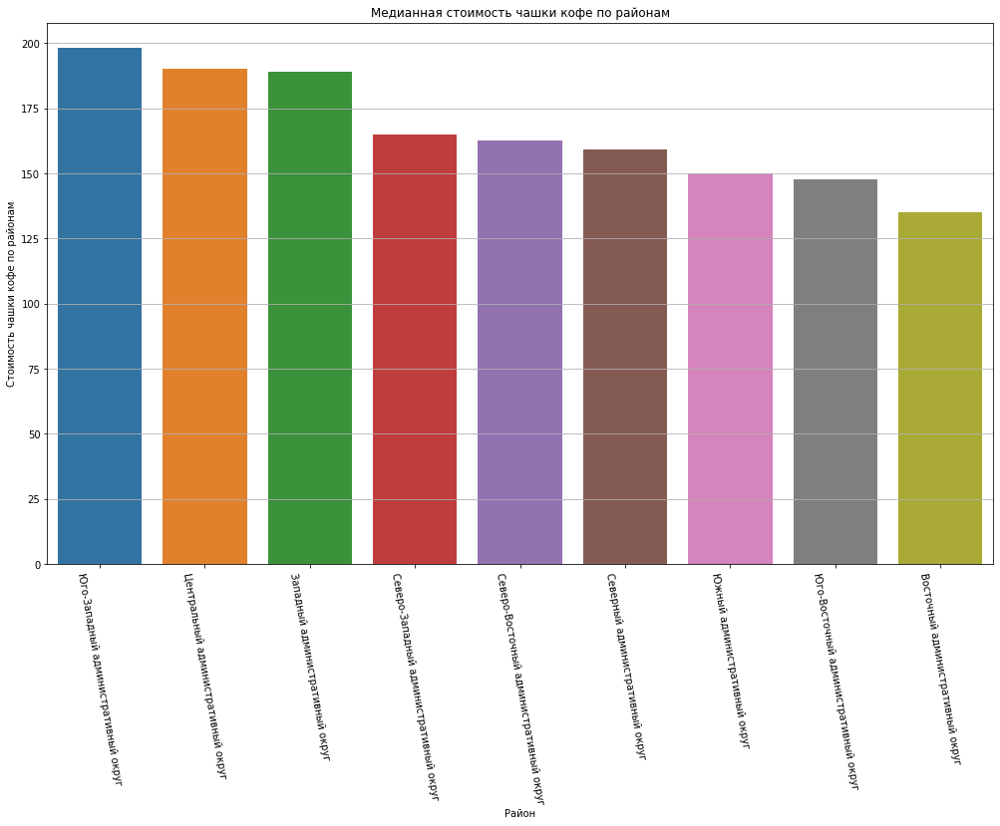

In [78]:
plt.figure(figsize=(17, 10))
plt.grid(True)
ax = sns.barplot(x='district', y='middle_coffee_cup', data=data_coffee.groupby('district').agg({'middle_coffee_cup':'median', 'name':'count', 'rating':'mean'}).sort_values(by='middle_coffee_cup', ascending=False).reset_index())
plt.title('Медианная стоимость чашки кофе по районам')
plt.xlabel('Район')
plt.ylabel('Cтоимость чашки кофе по районам')
plt.xticks(rotation = -80)
plt.show()

In [86]:
data_coffee.pivot_table(index=['district'], values='middle_coffee_cup', aggfunc='median').sort_values(by='middle_coffee_cup')

,middle_coffee_cup
district,
Восточный административный округ,135.0
Юго-Восточный административный округ,147.5
Южный административный округ,150.0
Северный административный округ,159.0
Северо-Восточный административный округ,162.5
Северо-Западный административный округ,165.0
Западный административный округ,189.0
Центральный административный округ,190.0
Юго-Западный административный округ,198.0


Традиционно: центр - дорого-богато. Запад и Юго-Запад элитно и неразумно дорого.

### Вывод

Достаточно привлекательными выглядят:
* Западный административный округ - высокая стоимость чашки кофе, среднее кол-во заведений, самй низкий рейтинг у них;
* Северо-Западный административный округ - средняя стоимость чашки кофе, малое кол-во заведений;
* Юго-Западный административный округ - очень высокая стоимость чашки кофе, малое кол-во заведений.

Для полноценного анализа необходимо знать стоимость аренды, кол-во жителей в районе, трафик.

Для старта стоит рассматривать Западный административный округ, со стоимостью чашки кофе 150 руб., при условии адекватной арендной ставки.

Презентация: https://disk.yandex.ru/i/OCS9P5SCN3Ujaw